In [5]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io


In [6]:
# sets the figure size and font
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 18})

In [7]:
# loads the faces (this is from the Data Science Driven Engineering Website - http://databookuw.com/)
mat_contents = scipy.io.loadmat('allFaces.mat') # based on the Yale Faces Database
faces = mat_contents['faces']
print('Faces is an array of size ', faces.shape)
# first size is the resolution (height by width) and the number of faces 

m = int(mat_contents['m']) # number of rows for face
n = int(mat_contents['n']) # number of columns for face
print('Each faces is reshaped from', m, 'rows and', n, 'columns')

# The nfaces array contains the number of picture for each person face in the matrix
# they add up to the width of the matrix. to verify try print(sum(nfaces)) 
nfaces = np.ndarray.flatten(mat_contents['nfaces'])
print('nfaces is an array of size ', nfaces.shape)



Faces is an array of size  (32256, 2410)
Each faces is reshaped from 168 rows and 192 columns
nfaces is an array of size  (38,)


(1152, 1008)


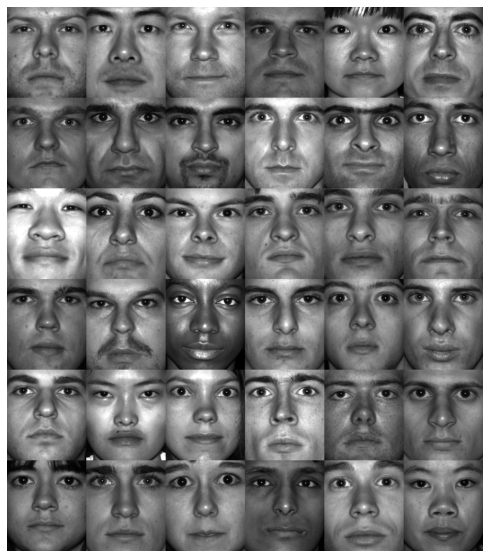

In [9]:
allPersons = np.zeros((n*6,m*6))
count = 0

for j in range(6):
    for k in range(6):
        allPersons[j*n : (j+1)*n, k*m : (k+1)*m] = np.reshape(faces[:,np.sum(nfaces[:count])],(m,n)).T
        count += 1

# These will show the first 36 people in the database arrange in one image
# for one specific light~ condition

print(allPersons.shape)
img = plt.imshow(allPersons)
img.set_cmap('gray')
plt.axis('off')
plt.show()

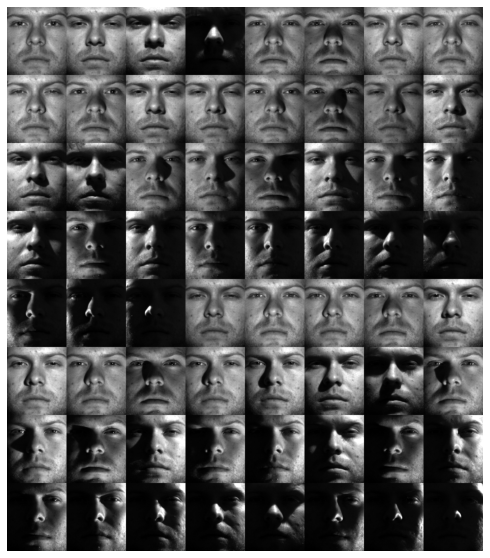

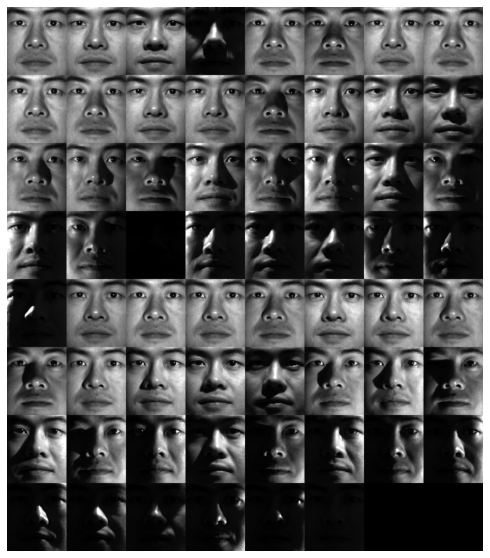

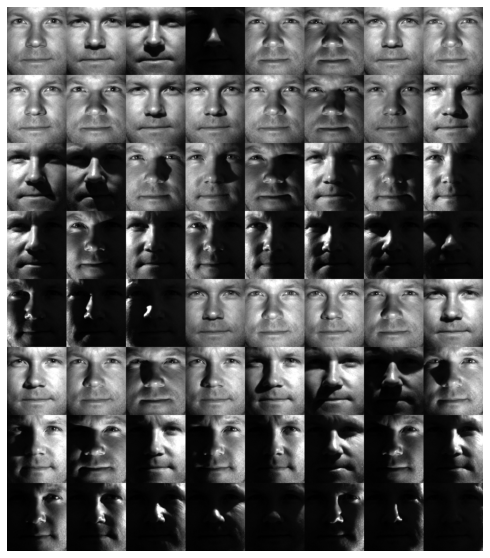

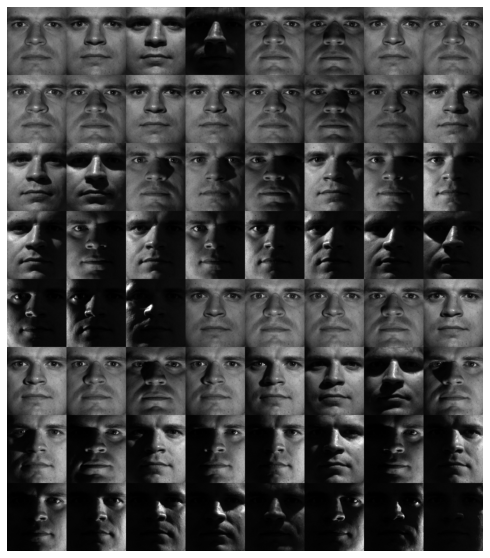

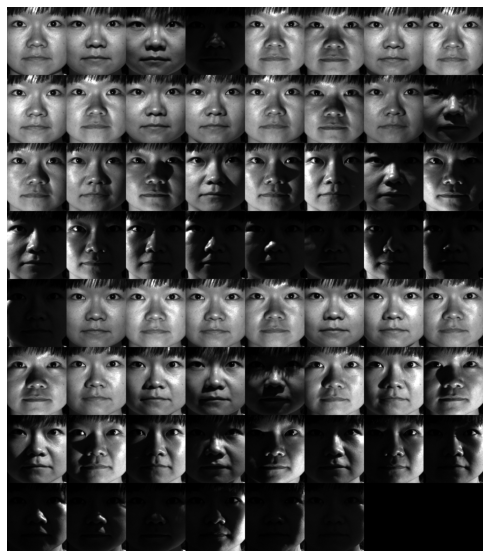

...

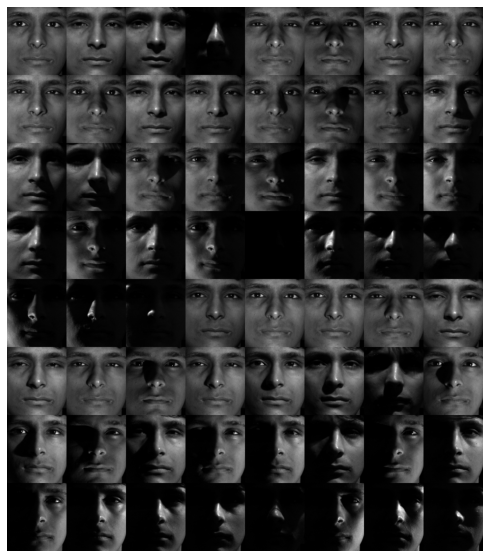

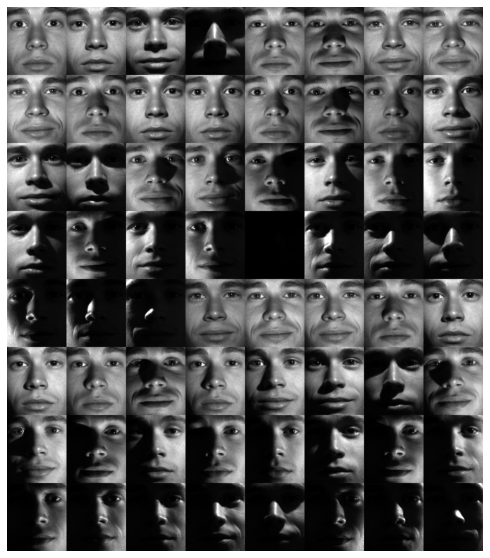

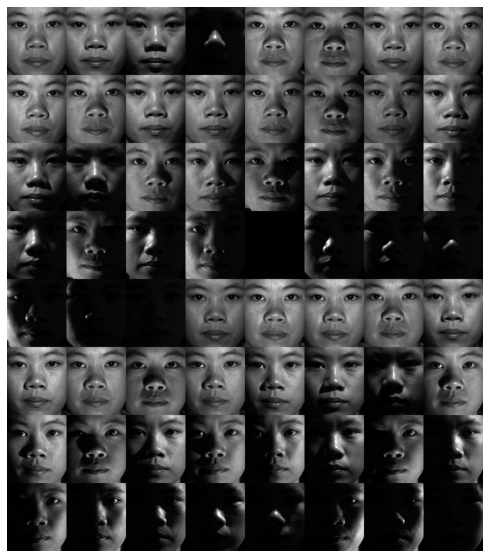

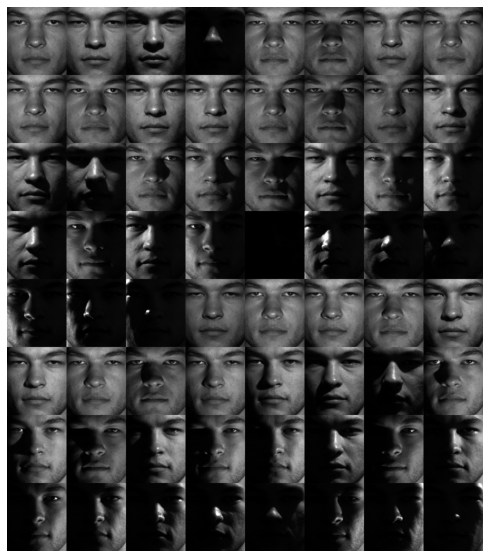

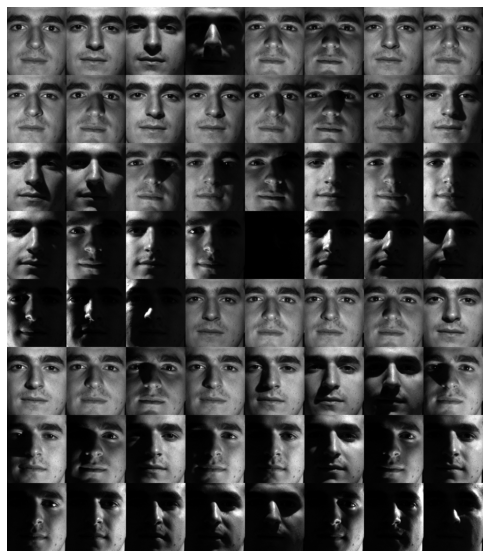

In [10]:
# This will show a composite of a few faces with different light conditions
personFace = {}
for person in range(len(nfaces)): # for all the number of persons. remember nfaces contains the
    subset = faces[ :, sum(nfaces[:person]):sum(nfaces[:(person+1)]) ] # the number of pic for each person
    # remember: the first dimension of the faces is the value of the pixels (m x n)
    personFace[person] = subset 
    subsetFaces = np.zeros((n*8, m*8))
    count = 0
    #subset has the indices for 64 faces
    for j in range(8):
        for k in range(8):
            if count < nfaces[person]: # until you get to the number of shades for each person
                subsetFaces[j*n : (j+1)*n, k*m : (k+1)*m] = np.reshape(subset[:,count],(m,n)).T
                
                count += 1
    img = plt.imshow(subsetFaces)
    img.set_cmap('gray')
    plt.axis('off')
    plt.show()


dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37])


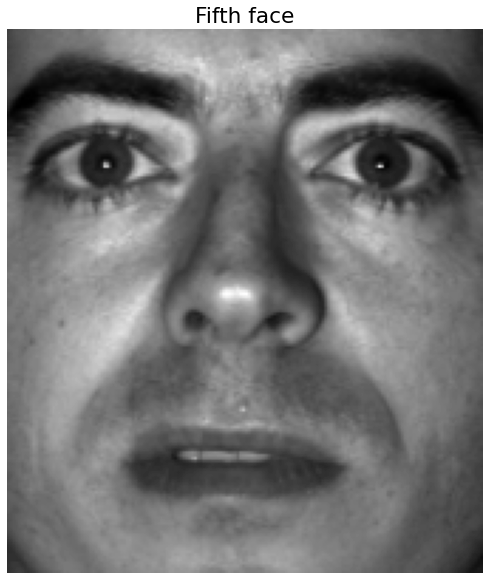

In [11]:
# Now personFace is a dictionary that has an individual face for each element
# Each face has n x m rows for 62 different shades, and there are 37 faces
print(personFace.keys())

# Shows the fifth face with the seventh level of brightness as an example
plt.imshow(np.reshape(personFace[5][:,7],(m,n)).T) #the transpose is there to rotate the picture
plt.set_cmap('gray')
plt.axis('off')
plt.title('Fifth face')
plt.show()

In [12]:
# We use the first 20 people only as training datav (all levels of brightness)
trainingFaces = faces[:,:np.sum(nfaces[:20])]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set

# Compute eigenfaces on mean-subtracted (centered) training data
X = trainingFaces - np.tile(avgFace,(trainingFaces.shape[1],1)).T # centering the training faces matrix
U, S, VT = np.linalg.svd(X,full_matrices=0) # take the SVD of the data matrix with 20 people



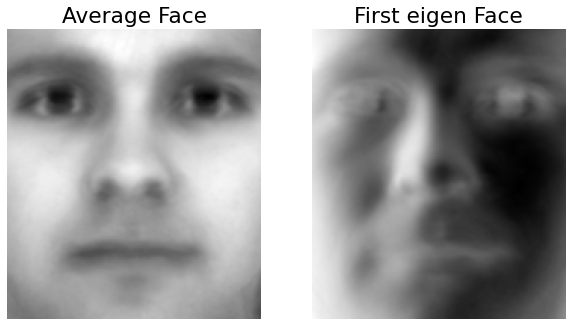

In [13]:
# This plots the average face, used earlier to center the first 20 
fig1 = plt.figure()
ax1 = fig1.add_subplot(121)
img_avg = ax1.imshow(np.reshape(avgFace,(m,n)).T)
img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Average Face')

ax2 = fig1.add_subplot(122)
img_u1 = ax2.imshow(np.reshape(U[:,0],(m,n)).T)
img_u1.set_cmap('gray')
plt.axis('off')
plt.title('First eigen Face')

plt.show()

# In other words each of the faces in the training set will be represented
# as a linear combination of the eigen faces as expressed by the SVD (U*S*VT)
# S is already expressed a 1D array (diagonal of the singular value matrix)
# (There are no zero values in S, as it's an economy SVD)



The first 10 eigenvalues in ascending orders are: [241457.10033693 235294.21789918  91110.80477423  64816.71133043
  50538.2416728   48807.80350654  44959.76162422  40706.77733119
  36736.4570571   35228.31729347]


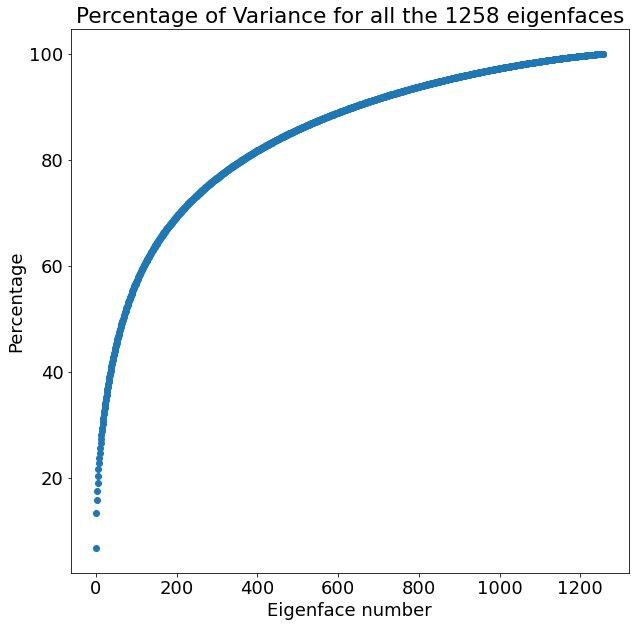

In [14]:
# The percentage of variance captured by the eigenfaces is shown against the number of eigenfaces (sorted in ascending order of eigenvalue)
plt.plot(np.arange(0,len(S)),np.cumsum(S/sum(S))*100,'o')
plt.title('Percentage of Variance for all the ' + str(len(S)) + ' eigenfaces')
plt.ylabel('Percentage')
plt.xlabel('Eigenface number')
print('The first 10 eigenvalues in ascending orders are:', S[0:10])

In [15]:
# Now we train with JUST the first face (all brightness levels)
trainingFace = personFace[1]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set

# Compute eigenfaces on mean-subtracted training data
Xf = trainingFace - np.tile(avgFace.T,(trainingFace.shape[1],1)).T # centering the training faces matrix
Uf, Sf, VTf = np.linalg.svd(Xf, full_matrices=0) # take the SVD of the data matrix with 20 people

Text(0.5, 0, 'Eigenface number')

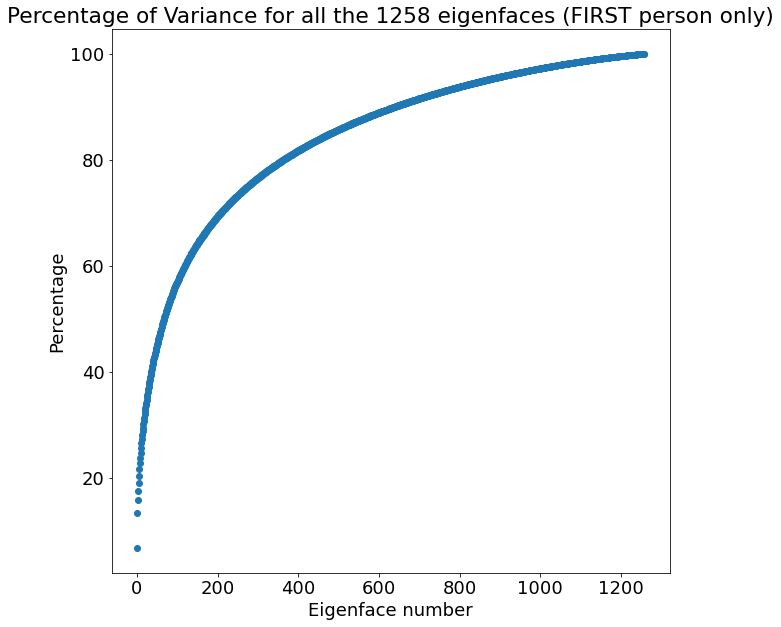

In [16]:
plt.plot(np.arange(0,len(S)),np.cumsum(S/sum(S))*100,'o')
plt.title('Percentage of Variance for all the ' + str(len(S)) + ' eigenfaces (FIRST person only)')
plt.ylabel('Percentage')
plt.xlabel('Eigenface number')
# again, this curve is quite smooth, making it difficult to decide an optimal truncation just by eyeballing the 
# singular value changes

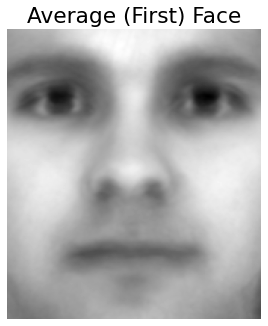

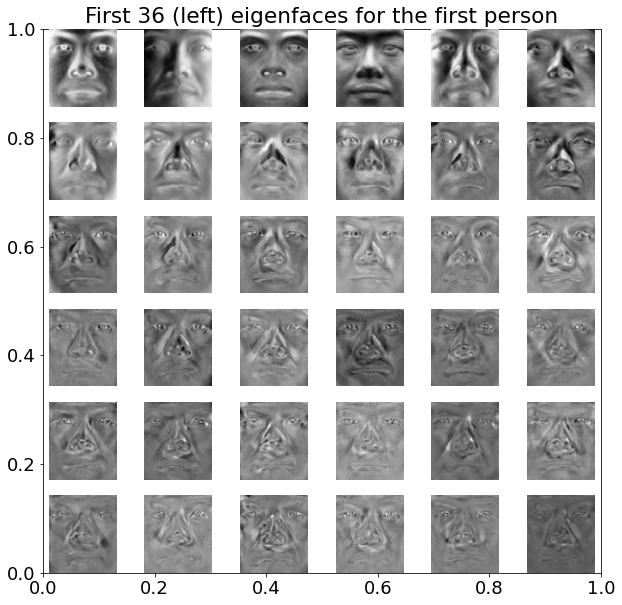

In [75]:
fig1 = plt.figure()
ax1 = fig1.add_subplot(121)
img_avg = ax1.imshow(np.reshape(avgFace,(m,n)).T)
img_avg.set_cmap('gray')
plt.axis('off')
plt.title('Average (First) Face')

fig2 = plt.figure()
        
plt.title('First 36 (left) eigenfaces for the first person')
for fc in range(6*6):
        ax2 = fig2.add_subplot(6,6,fc+1)
        img_u1 = ax2.imshow(np.reshape(Uf[:,fc],(m,n)).T)
        img_u1.set_cmap('gray')
        plt.axis('off')


plt.show()

Text(0.5, 1.0, 'UΣV𝖳')

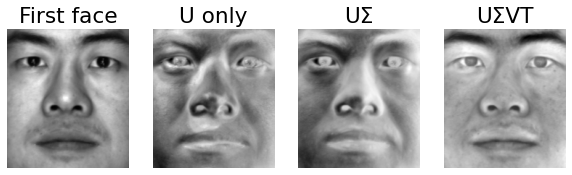

In [18]:
# We take the SVD of the first face again, and we look
# at the first 'r' columns of the U matrix.
# Remember those columns are the the eigenvectors of XX', where X is the centered
# matrix data for the first face, all levels of brightness

r = 10

fig1 = plt.figure() 

ax1 = fig1.add_subplot(141)
img_avg = np.mean(personFace[1][:,:r], axis = 1)
ax1.imshow(np.reshape(img_avg,(m,n)).T)
plt.axis('off')
plt.title('First face') # average across brightness


ax2 = fig1.add_subplot(142)
img_avg = np.mean(Uf[:,:r], axis = 1)
ax2.imshow(np.reshape(img_avg,(m,n)).T)
plt.axis('off')
plt.title('U only')

np.diag(Sf[:r])

ax3 = fig1.add_subplot(143)

img_avg = np.mean(Uf[:,:r]@np.diag(Sf[:r]), axis = 1)
ax3.imshow(np.reshape(img_avg,(m,n)).T)
plt.axis('off')
plt.title('UΣ')


ax4 = fig1.add_subplot(144)
img_avg = np.mean(Uf[:,:r]@np.diag(Sf[:r])@VTf[:r,:], axis = 1)
img_avg = ax4.imshow(np.reshape(img_avg,(m,n)).T)
plt.axis('off')
plt.title('UΣV𝖳')



We multiply the following matrices dimensions

(32256, 62) times (62, 62) times (62, 62) = (32256, 62)


<function matplotlib.pyplot.tight_layout(pad=1.08, h_pad=None, w_pad=None, rect=None)>

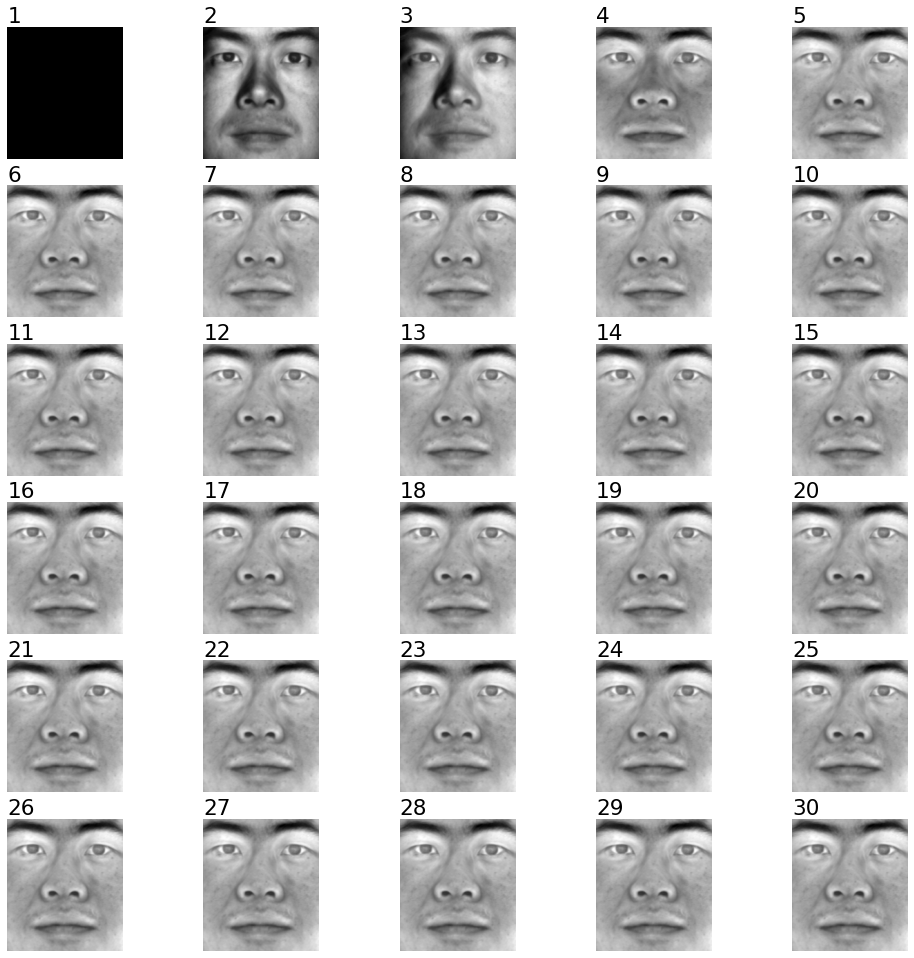

In [84]:
# We show the first face for different levels of truncation
# eigenvalues (bear in mind that eigenvalues are ordered in ascending order)

# this represent the dimensional matrix multiplication.
print('We multiply the following matrices dimensions\n')
print(str(Uf.shape) + ' times ' + str(np.diag(Sf).shape) + ' times '+ str(VTf.shape) + ' = ' + str((Uf.shape[0],VTf.shape[1])))

# We can reduce the middle value by taking only the first r eigenvalues
r_tot = 30

fig1 = plt.figure(figsize = (17,17))
for fc in np.arange(30):
        axn = fig1.add_subplot(6,5,fc+1)

        Urf = Uf[:,:fc] @ np.diag(Sf[:fc]) @ VTf[:fc,:]
        img_u1 = axn.imshow(np.reshape(np.mean(Urf,axis=1),(m,n)).T)
        img_u1.set_cmap('gray')
        plt.axis('off')
        plt.title(str(fc+1), fontweight = 3, pad = 0, loc = 'left')

plt.tight_layout

In [ ]:
## Project persons indexed i onto the PCA modes 
from mpl_toolkits import mplot3d
Pnum = np.array([2,7,8,10,11,12,15,17,19,20,21,32,33,34]) # Face number to display
PCAmodes = [5, 6] # Project onto PCA modes
shapes = ['d','^','s','o','d']
colors = ['r','b','k','g']

# Recalculate average face using the first 36 people (out of 38)
trainingFaces = faces[:,:np.sum(nfaces[:36])]
avgFace = np.mean(trainingFaces,axis=1) # Compute the average face for the training set
print(avgFace.shape)

# Compute eigenfaces on mean-subtracted (centered) training data
X = trainingFaces - np.tile(avgFace,(trainingFaces.shape[1],1)).T # centering the training faces matrix
U, S, VT = np.linalg.svd(X,full_matrices=0) # take the SVD of the data matrix with 36/38 people
print(X.shape)

(32256,)


In [ ]:
plt.rcParams['figure.figsize'] = [20, 30]
plt.rcParams.update({'font.size': 12})
fig = plt.figure()
ax1 = fig.add_subplot(311)
#ax2 = fig.add_subplot(312,projection='3d')
#ax3 = fig.add_subplot(313,projection='3d')

P = {}; PCACoords = {}; labels = {}
for c, i in enumerate(Pnum):
    P[c] = np.mean(personFace[i-1],axis=1) # Person number i (dict)
    #P[c] = P[c] - np.tile(avgFace,(P[c].shape[1],1)).T  # Subtract average
    PCACoords[c] = U[:,PCAmodes - np.ones_like(PCAmodes)].T @ P[c] #projecting a person's face onto PCA modes
    # ones_like return a array filled with 1 with the same size as the input
    labels[c] = '   ' + str(i)


for c in np.arange(len(Pnum)):
    plt.scatter(PCACoords[c][0],PCACoords[c][1],s = 200,marker = shapes[0],color = colors[0])
    plt.annotate(labels[c], (PCACoords[c][0], PCACoords[c][1]))

plt.axis('on')

plt.xlabel('PCA mode {}'.format(PCAmodes[0]));
plt.ylabel('PCA mode {}'.format(PCAmodes[1]));

plt.show()
plt.tight_layout()